## Path configuration

In [1]:
from pathlib import Path
import os

PROJECT_NAME = "MALDIAlign"

cwd = Path().resolve()

# Walk upwards until we find the project folder
target = None
for parent in [cwd] + list(cwd.parents):
    if parent.name == PROJECT_NAME:
        target = parent
        break

# If the project folder is found and we are not already there, then change cwd
if target is not None and target != cwd:
    os.chdir(target)

print("Working directory:", os.getcwd())

Working directory: /export/usuarios01/agnavarr/MALDIAlign


## Imports

In [2]:
import pickle
import numpy as np
import pandas as pd

# utils
from utils.config import load_config
from utils.data import load_pkl, map_domains
from utils.metrics import *
from utils.viz import *

# tools
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# models
from sklearn.ensemble import RandomForestClassifier

## Data loading

In [3]:
cfg = load_config()
driams_pkl = cfg["data"]["DRIAMS_REDUCED_PKL"]

In [4]:
driams = load_pkl(driams_pkl)

In [5]:
data, label, meta = driams["data"], driams["label"], driams["meta"]

In [6]:
# Apply normalization: scale each spectrum to [0, 1]
X_min = data.min(axis=1, keepdims=True)
X_max = data.max(axis=1, keepdims=True)
data_norm = (data - X_min) / (X_max - X_min + 1e-8)

In [7]:
meta = pd.DataFrame.from_records(list(meta))

In [8]:
# Filter the data by hospital
filtered_data = {}
for hosp in meta["hospital"].unique():
    idx = np.where(meta["hospital"].values == hosp)[0]
    filtered_data[hosp] = {
        "data": data_norm[idx],
        "label": label[idx],
        "meta": meta.iloc[idx]
    }

In [9]:
species, counts = np.unique(filtered_data["DRIAMS_A"]["label"], return_counts=True)
for sp, n in zip(species, counts):
    print(f"{sp}: {n}")

Enterobacter_cloacae_complex: 2573
Enterococcus_Faecium: 1800
Escherichia_Coli: 7381
Klebsiella_Pneumoniae: 4083
Pseudomonas_Aeruginosa: 4908
Staphylococcus_Aureus: 7065


In [10]:
# Declare the datasets
dataA, labelA, metaA = filtered_data["DRIAMS_A"]["data"], filtered_data["DRIAMS_A"]["label"], filtered_data["DRIAMS_A"]["meta"]
dataB, labelB, metaB = filtered_data["DRIAMS_B"]["data"], filtered_data["DRIAMS_B"]["label"], filtered_data["DRIAMS_B"]["meta"]
dataC, labelC, metaC = filtered_data["DRIAMS_C"]["data"], filtered_data["DRIAMS_C"]["label"], filtered_data["DRIAMS_C"]["meta"]
dataD, labelD, metaD = filtered_data["DRIAMS_D"]["data"], filtered_data["DRIAMS_D"]["label"], filtered_data["DRIAMS_D"]["meta"]

In [11]:
dataA.shape

(27810, 6000)

In [12]:
dataD.shape

(7308, 6000)

In [13]:
data

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(39781, 6000))

In [14]:
label

array(['Klebsiella_Pneumoniae', 'Klebsiella_Pneumoniae',
       'Klebsiella_Pneumoniae', ..., 'Enterobacter_cloacae_complex',
       'Enterobacter_cloacae_complex', 'Enterobacter_cloacae_complex'],
      shape=(39781,), dtype='<U28')

In [15]:
meta

,hospital,year,genus,species,study
0,DRIAMS_B,2018,Klebsiella,Pneumoniae,23a9e0ba-d4b2-40eb-808c-37270a5117dc.txt
1,DRIAMS_B,2018,Klebsiella,Pneumoniae,36437826-52fa-4daf-8f2b-4133f4307156.txt
2,DRIAMS_B,2018,Klebsiella,Pneumoniae,da983ae0-e887-4771-bdb1-9a8d564eb017.txt
3,DRIAMS_B,2018,Klebsiella,Pneumoniae,5e8f4603-1399-4ad5-a618-7e8bf2fc4207.txt
4,DRIAMS_B,2018,Klebsiella,Pneumoniae,ce63ff87-717d-4eac-8dca-590ffa840867.txt
...,...,...,...,...,...
39776,DRIAMS_A,2017,Enterobacter,Ludwigii,12a9f8dc-2ea4-4e61-9cb3-8a318e207b72_MALDI1.txt
39777,DRIAMS_C,2018,Enterobacter,Ludwigii,28082703960_A6.txt
39778,DRIAMS_C,2018,Enterobacter,Ludwigii,28020109560_F1.txt
39779,DRIAMS_C,2018,Enterobacter,Ludwigii,28030306620_F3.txt


## After domain alignment

#### Utils

In [16]:
import torch
from models.deep.cVAE import ConditionalVAE_Bernoulli_Extended
from sklearn.model_selection import GridSearchCV, StratifiedKFold

In [17]:
def load_model(model, path):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.load_state_dict(torch.load(path, map_location=device))
    model.to(device)
    model.eval()
    return model

def encode_with_domain(model, X, domain_ids, device, batch_size=256):
    """
    Encode data into latent space using domain-conditioned encoder.
    """
    model.eval()
    Z = []

    X_tensor = torch.tensor(X, dtype=torch.float32)
    domain_tensor = torch.tensor(domain_ids, dtype=torch.long)

    loader = torch.utils.data.DataLoader(
        torch.utils.data.TensorDataset(X_tensor, domain_tensor),
        batch_size=batch_size,
        shuffle=False
    )

    with torch.no_grad():
        for x, d in loader:
            x = x.to(device)
            d = d.to(device)

            c_domain = torch.nn.functional.one_hot(
                d, num_classes=model.cond_dim
            ).float()

            mu, _ = model.encoder(x, c_domain)
            Z.append(mu.cpu().numpy())

    return np.vstack(Z)

def find_best_rf(Z_train, y_train_z):
    param_grid = {
        "n_estimators": [200, 400, 800],
        "max_depth": [None, 20, 40],
    }

    rf = RandomForestClassifier(
        class_weight="balanced_subsample",
        n_jobs=-1,
        random_state=42
    )

    grid = GridSearchCV(
        estimator=rf,
        param_grid=param_grid,
        scoring="balanced_accuracy",
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        n_jobs=-1,
        verbose=1,
        refit=True  
    )
    grid.fit(Z_train, y_train_z)

    print("Best params:", grid.best_params_)
    print("Best CV balanced_acc:", grid.best_score_)

    # Evaluar en test de D
    rf_best = grid.best_estimator_
    return rf_best

#### Load and train

In [18]:
meta_all = pd.concat([metaA, metaD], ignore_index=True)
data_all = np.vstack([dataA, dataD])
label_all = np.concatenate([labelA, labelD])

domain_ids = map_domains(meta_all)

In [19]:
vae_path = "/export/usuarios01/agnavarr/MALDIAlign/experiments/results/cvae/20251231_141859/model.pth"

backbone = ConditionalVAE_Bernoulli_Extended(
    input_dim=dataA.shape[1],
    latent_dim=64,
    cond_dim=2
)

vae = load_model(backbone, vae_path)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [20]:
Z_all = encode_with_domain(
    model=vae,
    X=data_all,
    domain_ids=domain_ids,
    device=device
)

print("Latent space shape:", Z_all.shape)


# Get latent representations
Z_A = Z_all[domain_ids == 0]
Z_D = Z_all[domain_ids == 1]
print(f"Z_A: {Z_A.shape}, Z_D: {Z_D.shape}")

# Define train and test
Z_train, y_train_z = Z_A, labelA
Z_test, y_test_z = Z_D, labelD

Latent space shape: (35118, 64)
Z_A: (27810, 64), Z_D: (7308, 64)


In [21]:
rf_best = RandomForestClassifier(
    n_estimators=300,         
    max_depth=30,              
    min_samples_leaf=5,        
    max_features="sqrt",
    class_weight="balanced_subsample",
    n_jobs=-1,
    random_state=42
)

rf_best.fit(Z_train, y_train_z)

,n_estimators,300
,criterion,'gini'
,max_depth,30
,min_samples_split,2
,min_samples_leaf,5
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


#### Test


===== Metrics =====
Domain: A (train) RF-latent
Balanced Accuracy: 0.9997
F1 Macro: 0.9997
Recall Macro: 0.9997
Specificity Macro: 0.9999



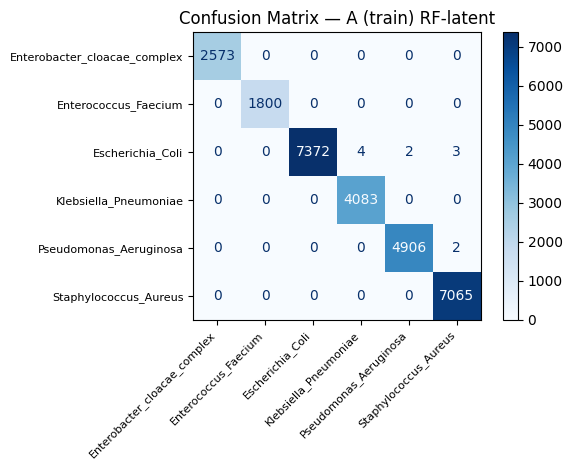


===== Metrics =====
Domain: D (test)  RF-latent
Balanced Accuracy: 0.9140
F1 Macro: 0.8509
Recall Macro: 0.9140
Specificity Macro: 0.9801



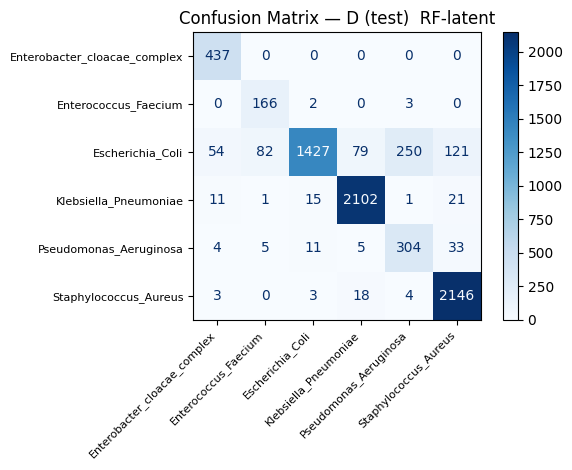

In [22]:
metrics_rf_train = metrics_report(Z_train, y_train_z, rf_best, "A (train) RF-latent")
metrics_rf_test  = metrics_report(Z_test,  y_test_z,  rf_best, "D (test)  RF-latent")
print_metrics(metrics_rf_train)
print_metrics(metrics_rf_test)

Find misclassified points

In [23]:
y_pred_A = rf_best.predict(Z_train)
y_pred_D = rf_best.predict(Z_test)

idx_A = np.where(y_pred_A != y_train_z)[0]
idx_D = np.where(y_pred_D != y_test_z)[0]

idx_A_global = np.where(meta_all["hospital"] == "DRIAMS_A")[0]
idx_D_global = np.where(meta_all["hospital"] == "DRIAMS_D")[0]

mis_idx_A_global = idx_A_global[idx_A]
mis_idx_D_global = idx_D_global[idx_D]

mis_idx_all_global = np.concatenate([
    mis_idx_A_global,
    mis_idx_D_global
])

#### t-SNE

In [24]:
tsne_multi_df = compute_tsne_df(Z_all, label_all, meta_all)

##### Global


===== t-SNE: Global (colored by species) =====


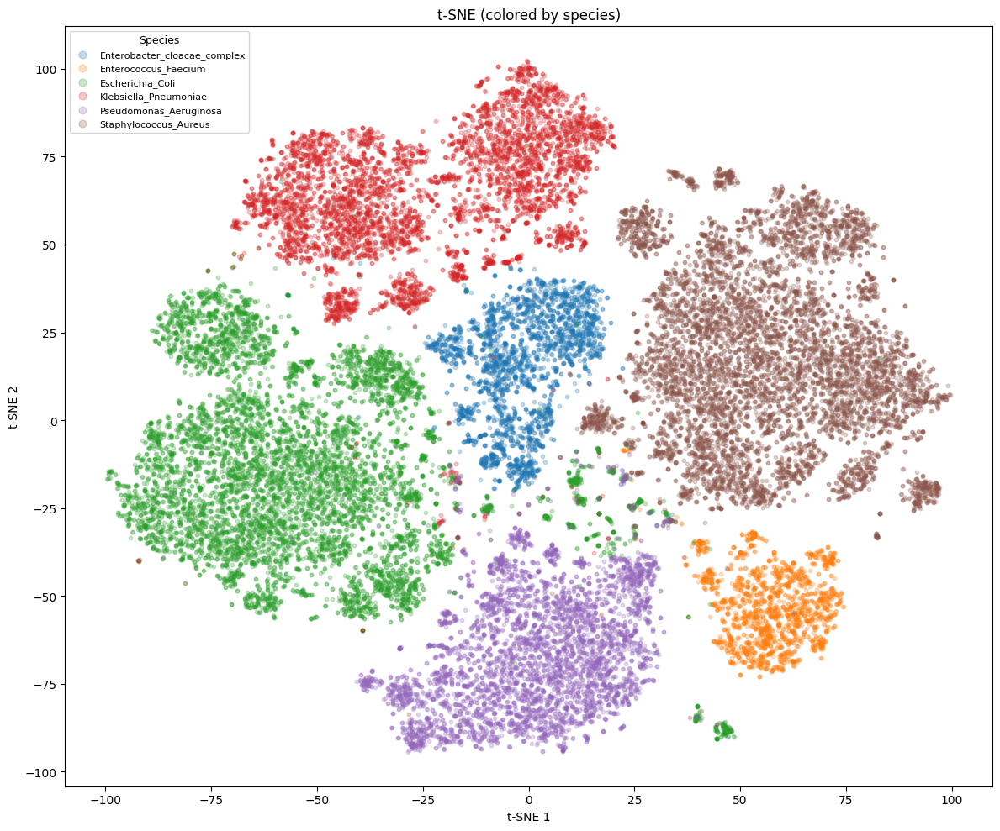


===== t-SNE: Global (colored by species) + misclassified points =====


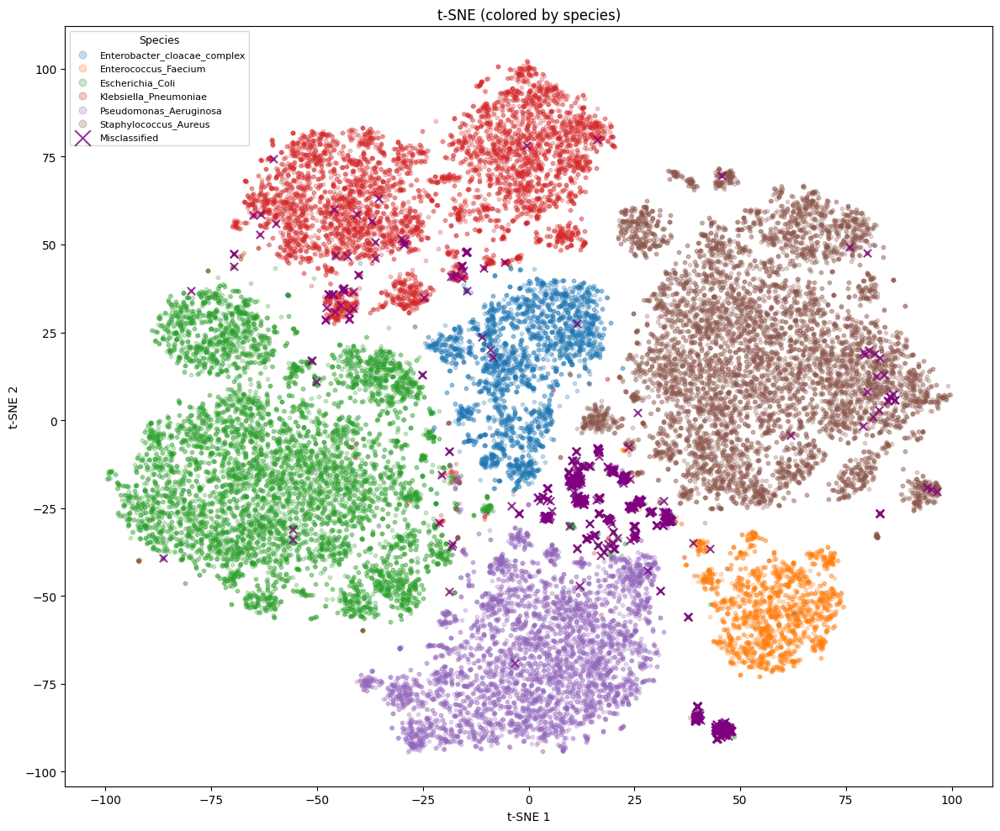


===== t-SNE: Per-species (colored by hospital) =====


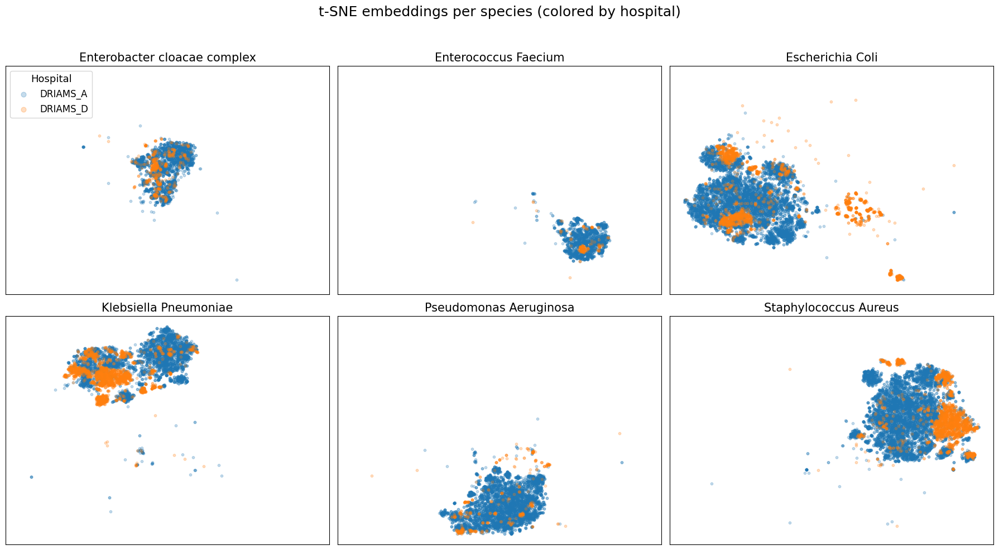


===== t-SNE: Per-species (colored by hospital) + misclassified points =====


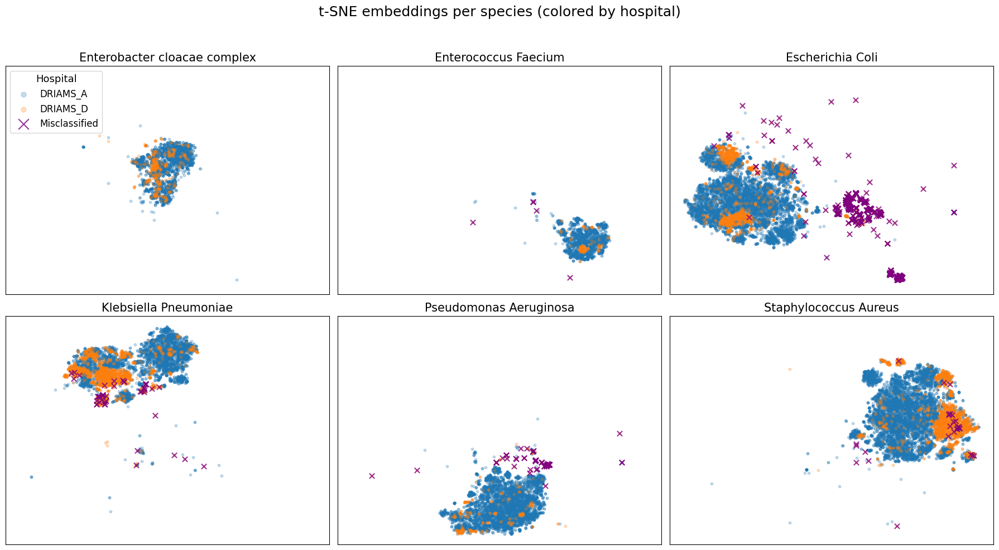


===== t-SNE: Per-species (overlay per hospital) + misclassified points =====


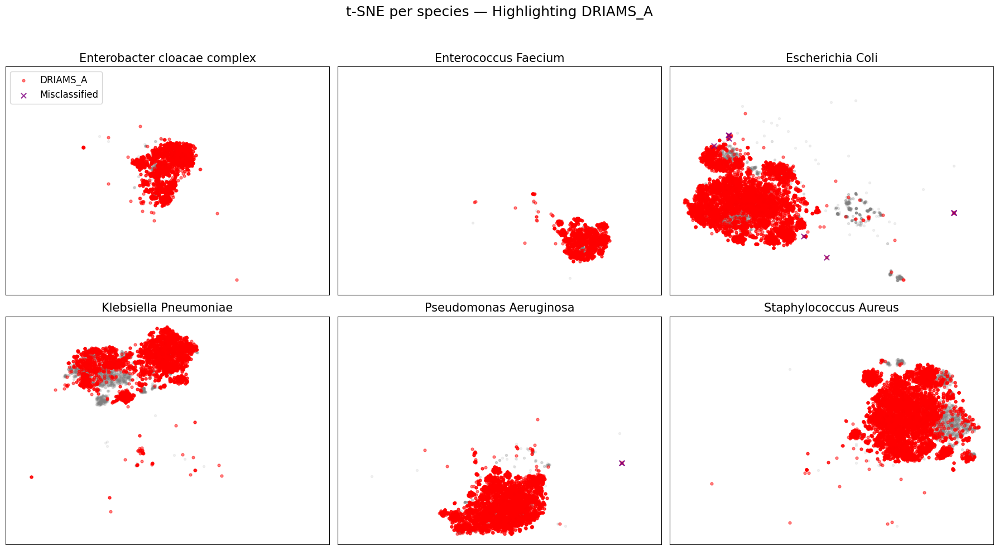

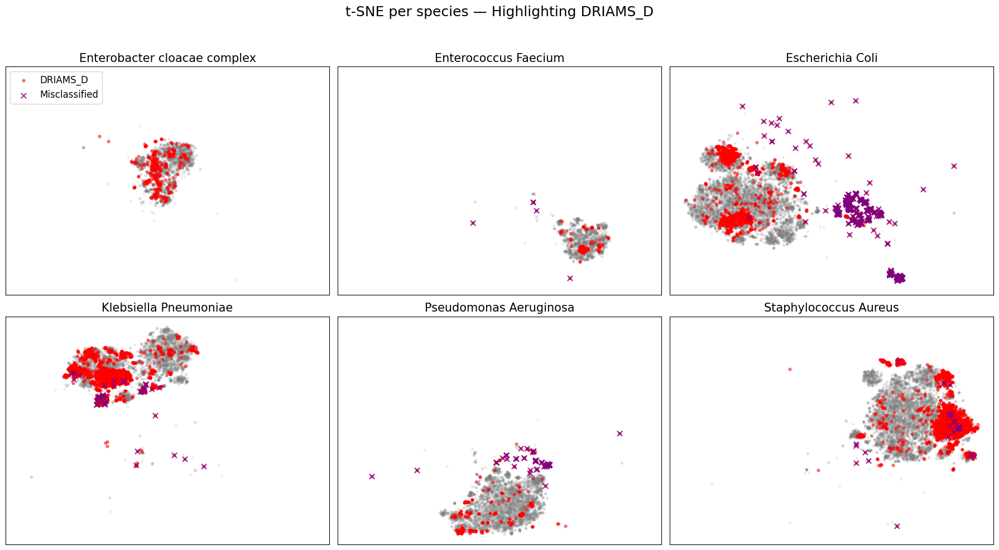


===== t-SNE: Per-species (overlay per year) =====


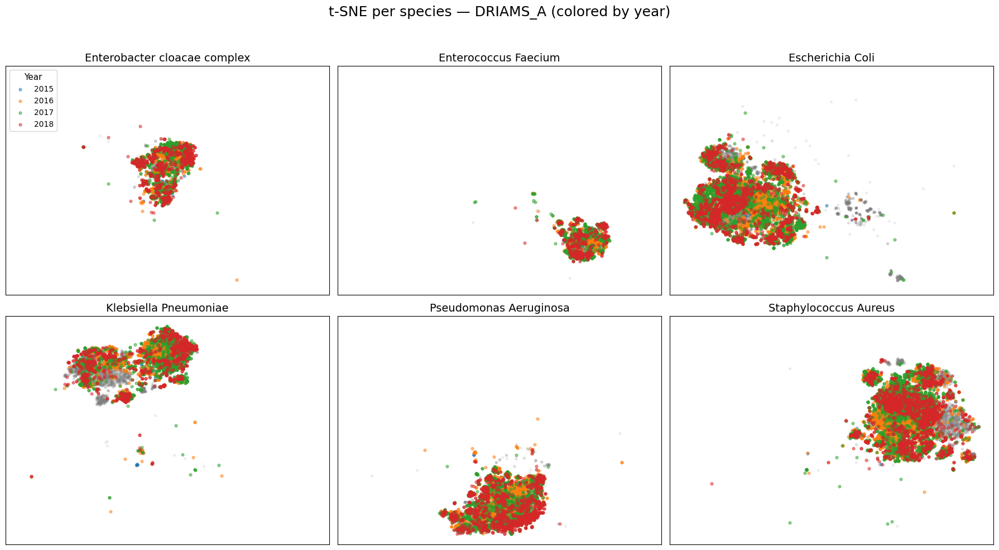

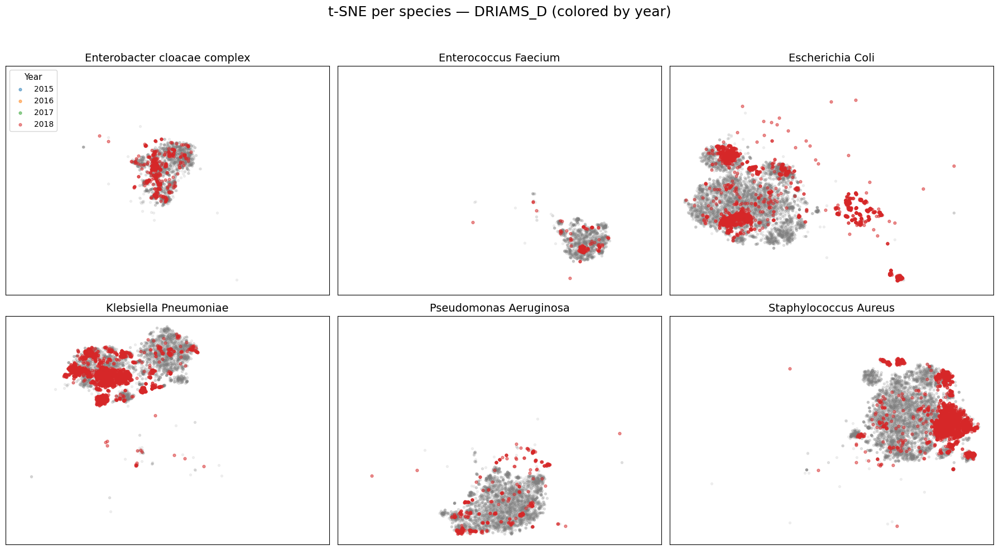


===== t-SNE: Per-species (overlay per year) + misclassified points =====


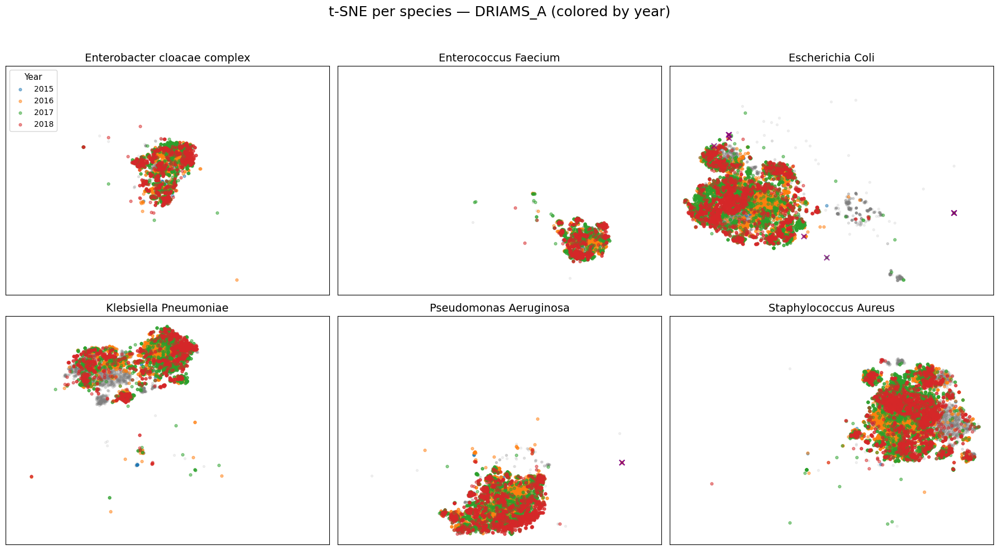

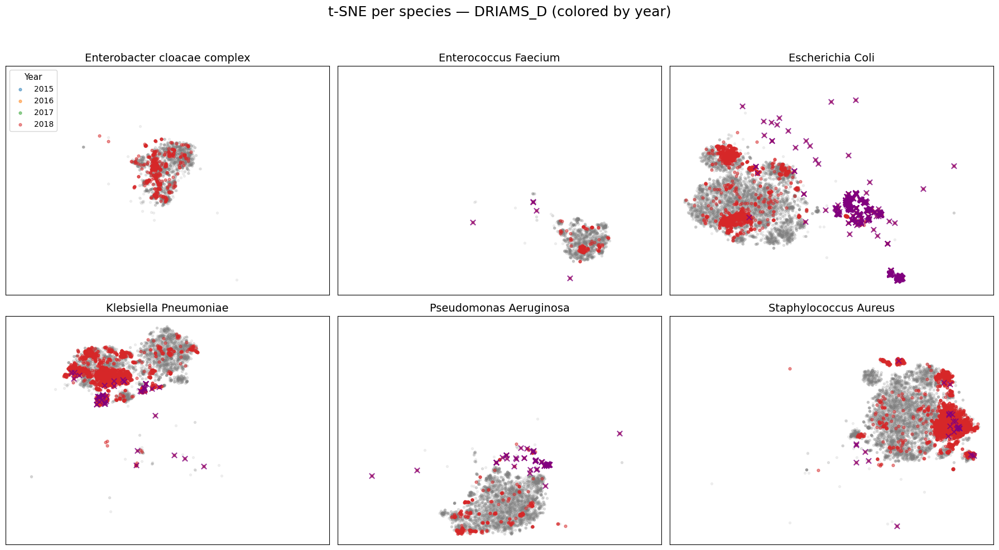

In [25]:
print("\n===== t-SNE: Global (colored by species) =====")
plot_tsne_global(tsne_multi_df, per_species=False)

print("\n===== t-SNE: Global (colored by species) + misclassified points =====")
plot_tsne_global(tsne_multi_df, per_species=False, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (colored by hospital) =====")
plot_tsne_global(tsne_multi_df, per_species=True)

print("\n===== t-SNE: Per-species (colored by hospital) + misclassified points =====")
plot_tsne_global(tsne_multi_df, per_species=True, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (overlay per hospital) + misclassified points =====")
plot_tsne_global(tsne_multi_df, per_species=True, overlay_per_hospital=True, idx=mis_idx_all_global)

print("\n===== t-SNE: Per-species (overlay per year) =====")
plot_tsne_global(tsne_multi_df, per_species=True, overlay_per_year=True)

print("\n===== t-SNE: Per-species (overlay per year) + misclassified points =====")
plot_tsne_global(tsne_multi_df, per_species=True, overlay_per_year=True, idx=mis_idx_all_global)

##### Per species

In [26]:
df_all, tsne_results = compute_tsne_per_species(Z_all, label_all, meta_all, prefix="f")


===== t-SNE (per species): colored by hospital =====


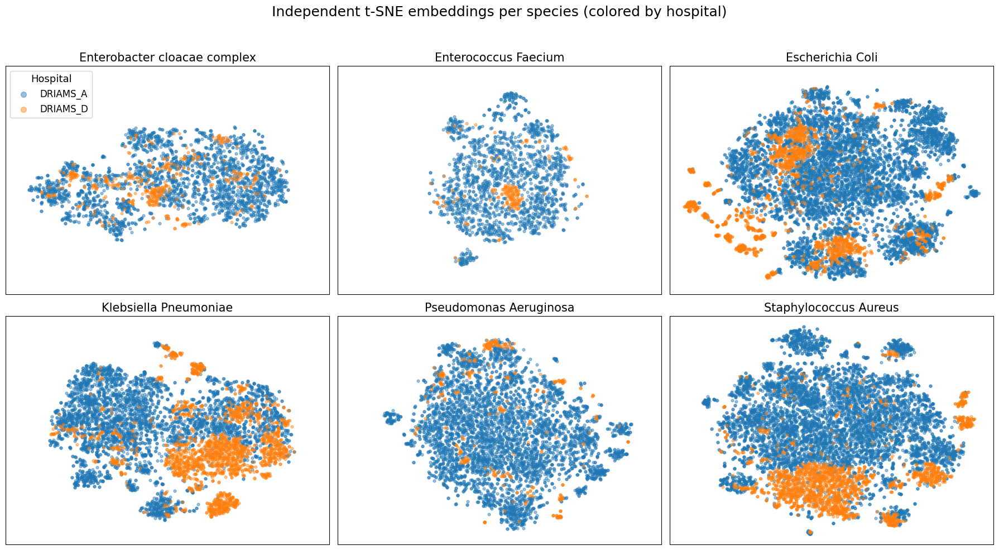


===== t-SNE (per species): colored by hospital + misclassified points =====


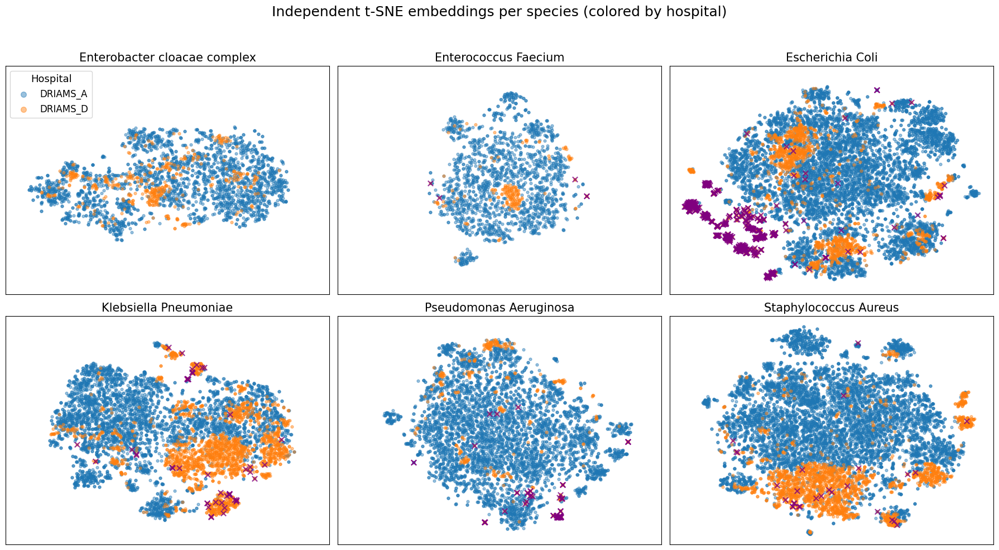


===== t-SNE (per species): overlay per hospital + misclassified points =====


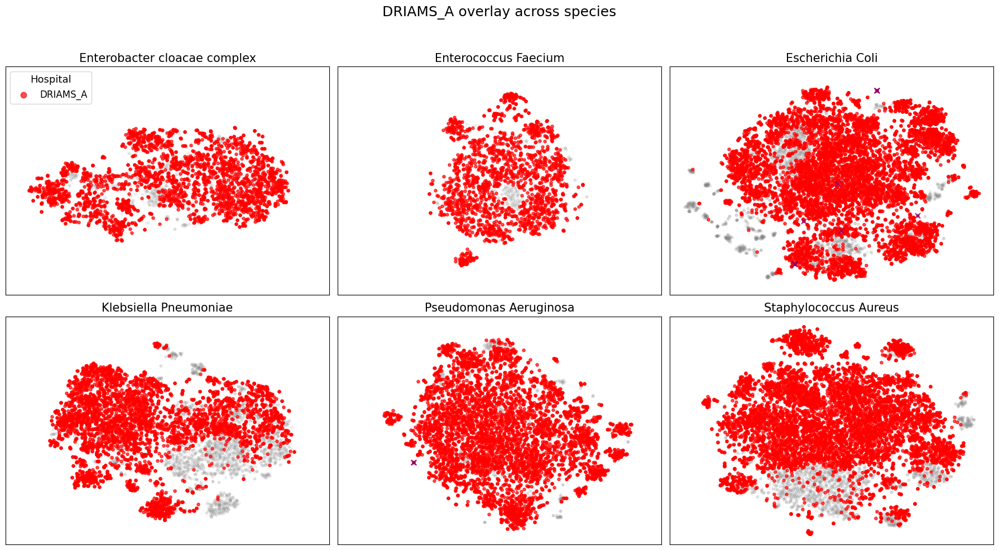

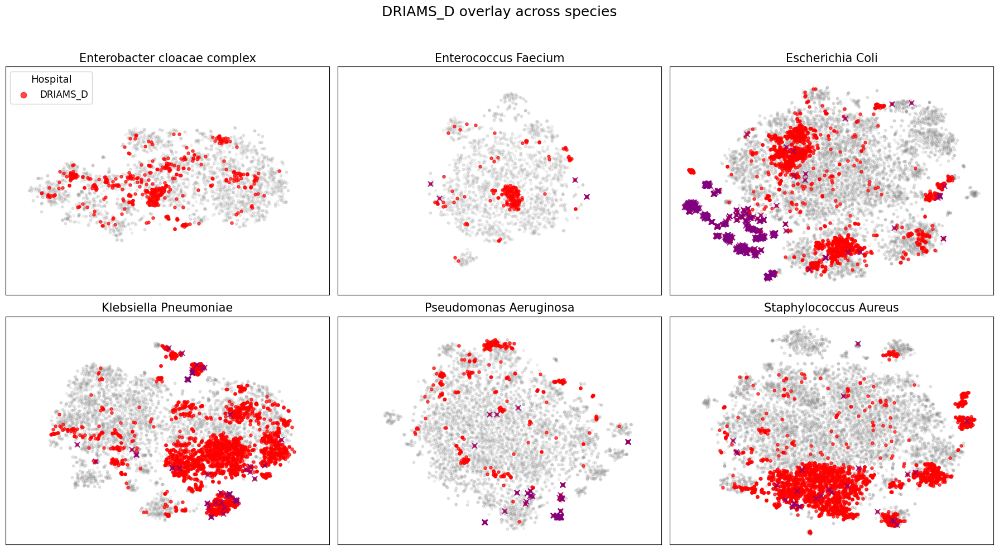


===== t-SNE (per species): overlay per year =====


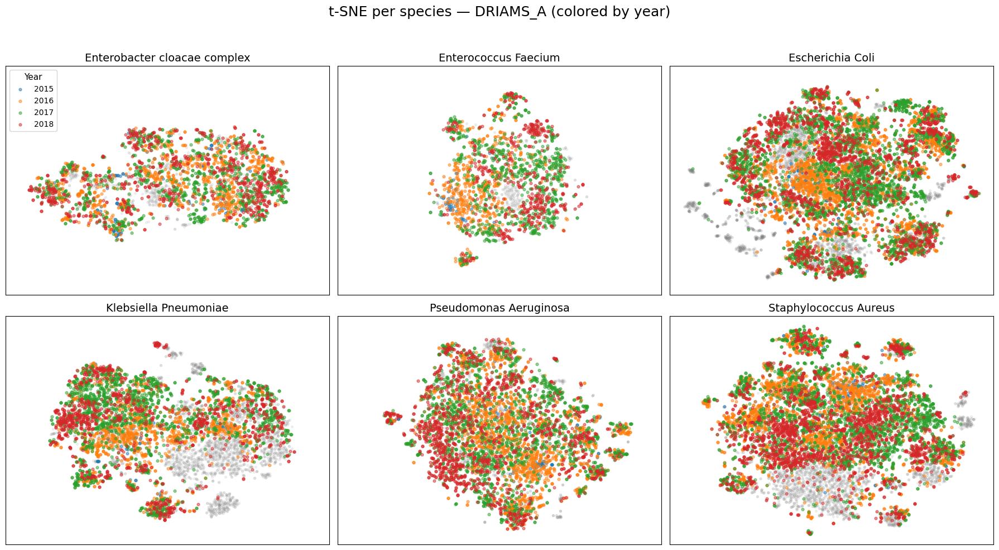

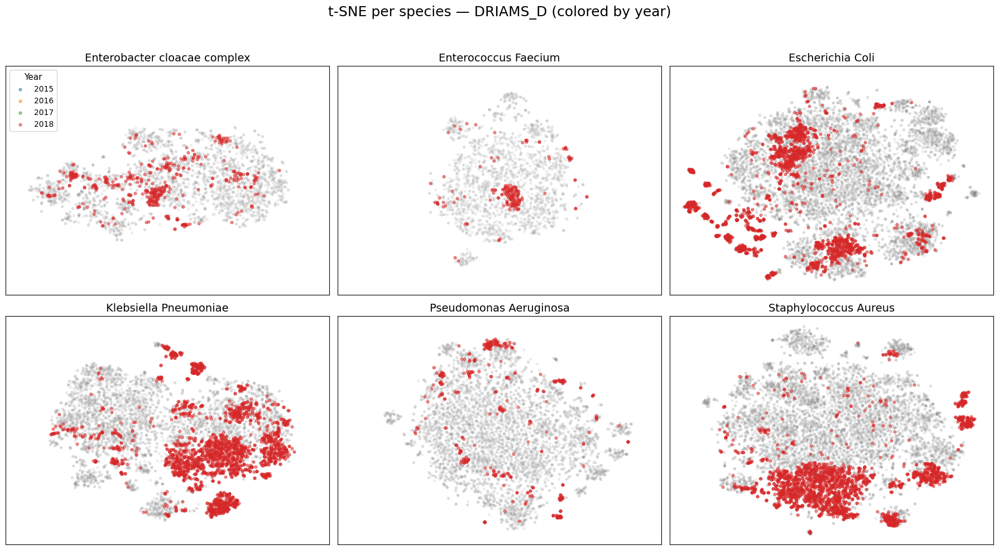


===== t-SNE (per species): overlay per year + misclassified points =====


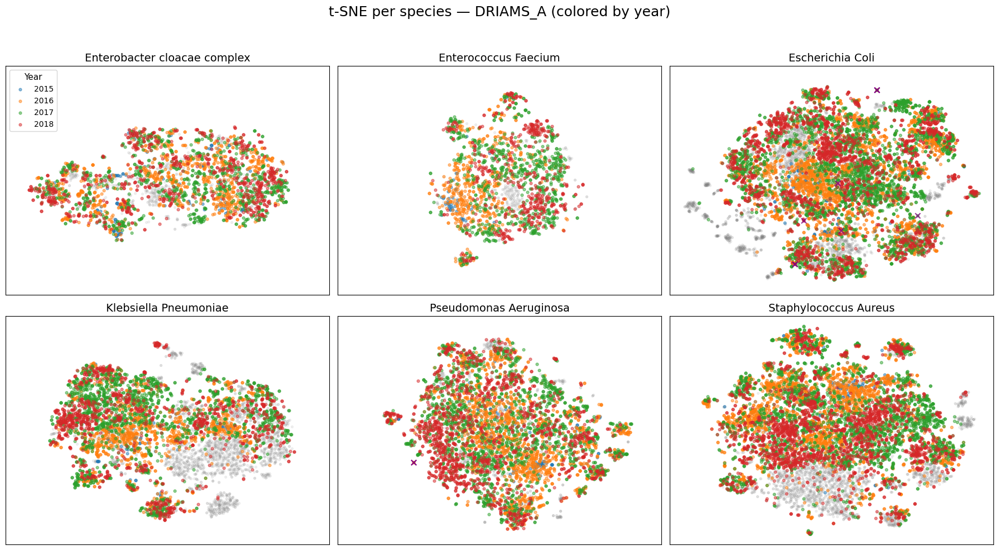

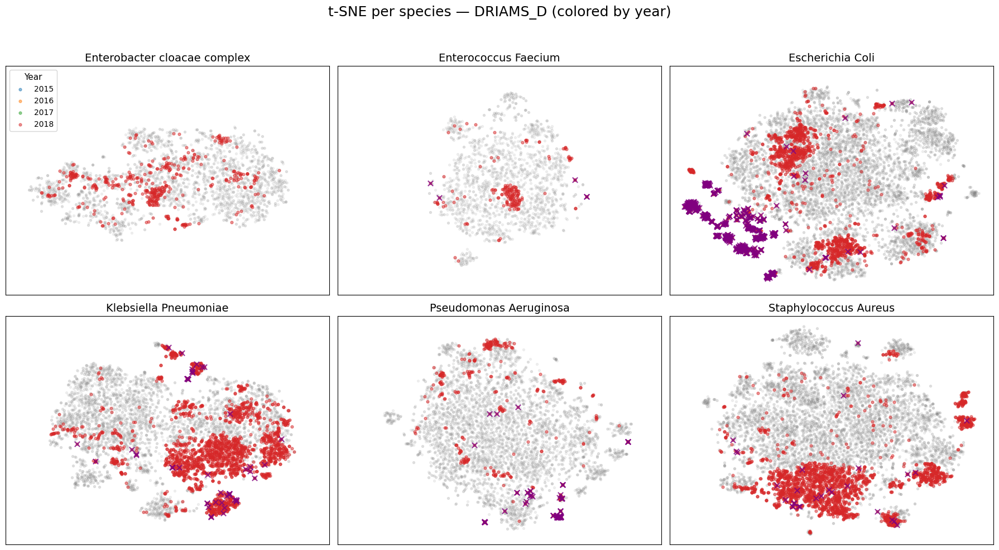

In [27]:
print("\n===== t-SNE (per species): colored by hospital =====")
plot_tsne_species(df_all, tsne_results, idx=None)

print("\n===== t-SNE (per species): colored by hospital + misclassified points =====")
plot_tsne_species(df_all, tsne_results, idx=mis_idx_all_global)

print("\n===== t-SNE (per species): overlay per hospital + misclassified points =====")
plot_tsne_species(df_all, tsne_results, overlay_per_hospital=True, idx=mis_idx_all_global)

print("\n===== t-SNE (per species): overlay per year =====")
plot_tsne_species(df_all, tsne_results, overlay_per_year_per_species=True)

print("\n===== t-SNE (per species): overlay per year + misclassified points =====")
plot_tsne_species(df_all, tsne_results, overlay_per_year_per_species=True, idx=mis_idx_all_global)